In [162]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from utils import show_images

In [163]:
cuadro0 = cv2.imread('img/udesa_0.jpg', cv2.IMREAD_GRAYSCALE) # --> source image 
cuadro1 = cv2.imread('img/udesa_1.jpg', cv2.IMREAD_GRAYSCALE)  # --> destination image 1  
cuadro2 = cv2.imread('img/udesa_2.jpg', cv2.IMREAD_GRAYSCALE) # --> destination image  2

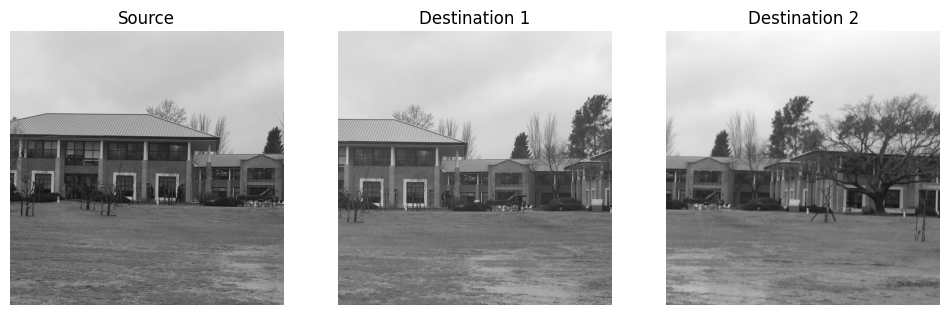

In [164]:
# Display images
show_images([
    cuadro0, cuadro1, cuadro2
], ["Source", "Destination 1", "Destination 2"])

In [165]:
# Check image sizes
print('Source Image Size:', cuadro0.shape)
print('Destination Image 1 Size:', cuadro1.shape)
print('Destination Image 2 Size:', cuadro2.shape)

Source Image Size: (3000, 3000)
Destination Image 1 Size: (3000, 3000)
Destination Image 2 Size: (3000, 3000)


In [166]:
# Busqueda de keypoints y descriptores
algo = cv2.SIFT_create()
kp0, des0 = algo.detectAndCompute(cuadro0, None)
kp1, des1 = algo.detectAndCompute(cuadro1, None)
kp2, des2 = algo.detectAndCompute(cuadro2, None)

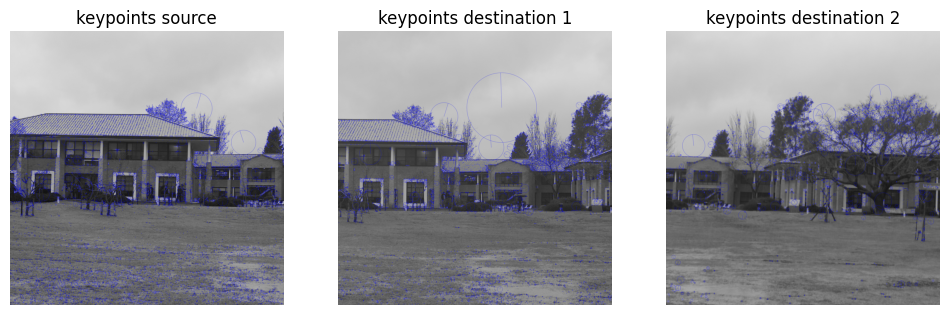

In [167]:
kp_cuadro0 = cv2.cvtColor(cuadro0, cv2.COLOR_GRAY2BGR)
kp_cuadro1 = cv2.cvtColor(cuadro1, cv2.COLOR_GRAY2BGR)
kp_cuadro2 = cv2.cvtColor(cuadro2, cv2.COLOR_GRAY2BGR)

# Display keypoints
kp_cuadro0 = cv2.drawKeypoints(cuadro0, kp0, 0, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
kp_cuadro1 = cv2.drawKeypoints(cuadro1, kp1, 0, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
kp_cuadro2 = cv2.drawKeypoints(cuadro2, kp2, 0, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display images
show_images([
    kp_cuadro0, kp_cuadro1, kp_cuadro2
], ["keypoints source", "keypoints destination 1", "keypoints destination 2"])

In [168]:
def match_descriptors(des_A, des_B):
    """ Match descriptors from two images (A and B) using the brute force matcher """
    # Matching descriptors
    bf = cv2.BFMatcher( )
    matches = bf.knnMatch(des_A, des_B, k=2) # returns k best matches for each descriptor in the source image 

    # We want matches whose second best match is much worse than the best match (else, is likely to be noise)
    matchesMask = [[0, 0] for i in range(len(matches))]
    for i, (m, n) in enumerate(matches):
        if m.distance < 0.5 * n.distance:
            matchesMask[i] = [1, 0]
    return matches, matchesMask

In [169]:
matches01, matchesMask01 = match_descriptors(des0, des1)
matches21, matchesMask21 = match_descriptors(des2, des1)

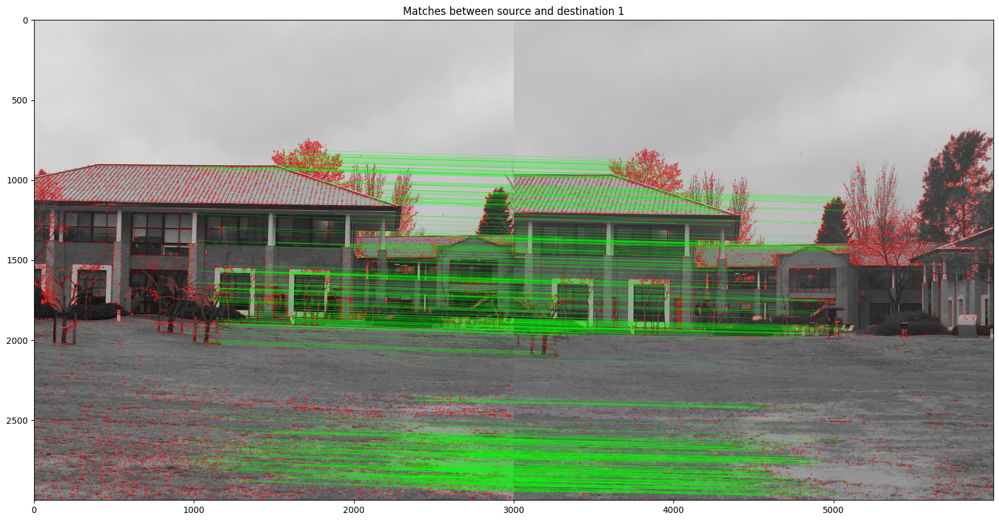

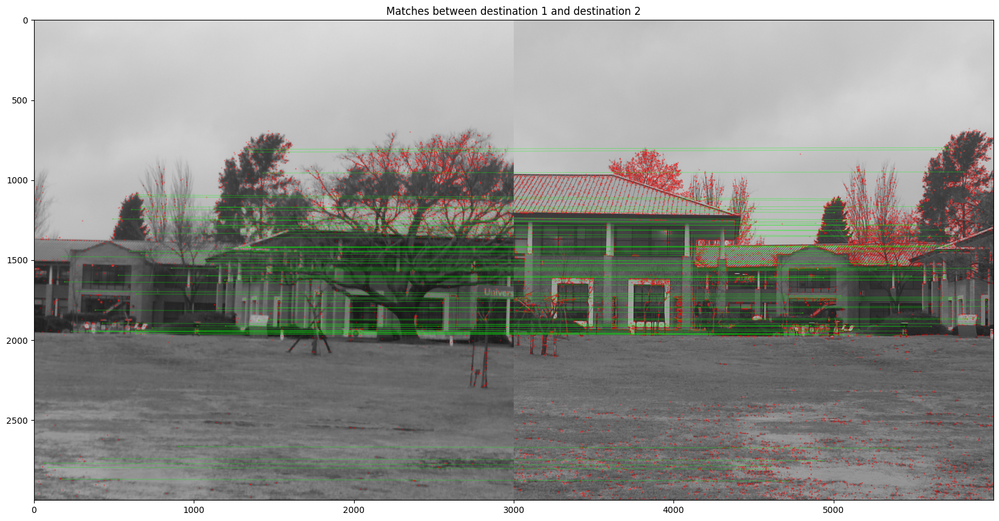

In [170]:
# Draw only good matches
draw_params_01 = dict(matchColor=(0, 255, 0), singlePointColor=(255, 0, 0), matchesMask=matchesMask01, flags=cv2.DrawMatchesFlags_DEFAULT)
draw_params_21 = dict(matchColor=(0, 255, 0), singlePointColor=(255, 0, 0), matchesMask=matchesMask21, flags=cv2.DrawMatchesFlags_DEFAULT)

img_matches01 = cv2.drawMatchesKnn(cuadro0, kp0, cuadro1, kp1, matches01, None, **draw_params_01)
img_matches21 = cv2.drawMatchesKnn(cuadro2, kp2, cuadro1, kp1, matches21, None, **draw_params_21)

plt.figure(figsize=(20, 16))
plt.imshow(img_matches01)
plt.title("Matches between source and destination 1")
plt.show()

plt.figure(figsize=(20, 16))
plt.imshow(img_matches21)
plt.title("Matches between destination 1 and destination 2")
plt.show()

In [171]:
def get_good_matches(matches, matchesMask):
    """ Get the good matches from the matches and matchesMask """
    good_matches = []
    for i, (m, n) in enumerate(matches):
        if matchesMask[i][0] == 1:
            good_matches.append(m)
    return good_matches

def find_homography(kp1, kp2, matches):
    """ Find the homography matrix between two images """
    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)  # The reshape is needed to convert the list of points to the shape (n,1,2). n=-1 means the number of points is unknown 
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
    H, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0) # 5.0 is the threshold to determine if a point is an inlier or not. The lower the threshold, the more strict the RANSAC algorithm is.
    return H

In [172]:
# Now we want to find the homography matrix that maps the source image to the destination image
good_matches01 = get_good_matches(matches01, matchesMask01)
good_matches21 = get_good_matches(matches21, matchesMask21)

print('Number of good matches:', len(good_matches01)) # remember: minimum matches needed to find the homography matrix is 4 (each match provides 2 equations)
print('Number of good matches:', len(good_matches21))

# Find homographies
H01 = find_homography(kp0, kp1, good_matches01)
H21 = find_homography(kp2, kp1, good_matches21)

Number of good matches: 512
Number of good matches: 68


In [173]:
def warp_images(img1, img2, H):
    """ Warp img1 to img2 using the homography matrix H """
    h1, w1 = img1.shape
    h2, w2 = img2.shape
    
    pts1 = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2) # Coordinates of the 4 corners of the source image
    pts2 = np.float32([[0, 0], [0, h2], [w2, h2], [w2, 0]]).reshape(-1, 1, 2) # Coordinates of the 4 corners of the destination image
    pts1_transformed = cv2.perspectiveTransform(pts1, H) # Apply the homography matrix to the source image corners to find the corresponding corners in the destination image
    
    pts = np.concatenate((pts2, pts1_transformed), axis=0) # Concatenate the corners of the destination image and the corners of the source image warped to the destination image
    
    [x_min, y_min] = np.int32(pts.min(axis=0).ravel() - 0.5) # Find the min and max x and y coordinates of the corners of the warped source image in the destination image (subtract 0.5 to round down) 
    [x_max, y_max] = np.int32(pts.max(axis=0).ravel() + 0.5) 
    
    translation_dist = [-x_min, -y_min]
    H_translation = np.array([[1, 0, translation_dist[0]], [0, 1, translation_dist[1]], [0, 0, 1]]) # Translation matrix 

    img1_warp = cv2.warpPerspective(img1, H_translation.dot(H), (x_max-x_min, y_max-y_min))

    if img1.shape == img2.shape:
        img1_warp[translation_dist[1]:h1 + translation_dist[1], translation_dist[0]:w1 + translation_dist[0]] = img2
        result = img1_warp
    else:
        result = np.zeros((y_max - y_min, x_max - x_min), dtype=img2.dtype)
        result[translation_dist[1]:h2 + translation_dist[1], translation_dist[0]:w2 + translation_dist[0]] = img2
        result = np.maximum(result, img1_warp)
    return result

In [174]:
# Warp images
result01 = warp_images(cuadro0, cuadro1, H01)  
result21 = warp_images(cuadro2, cuadro1, H21)


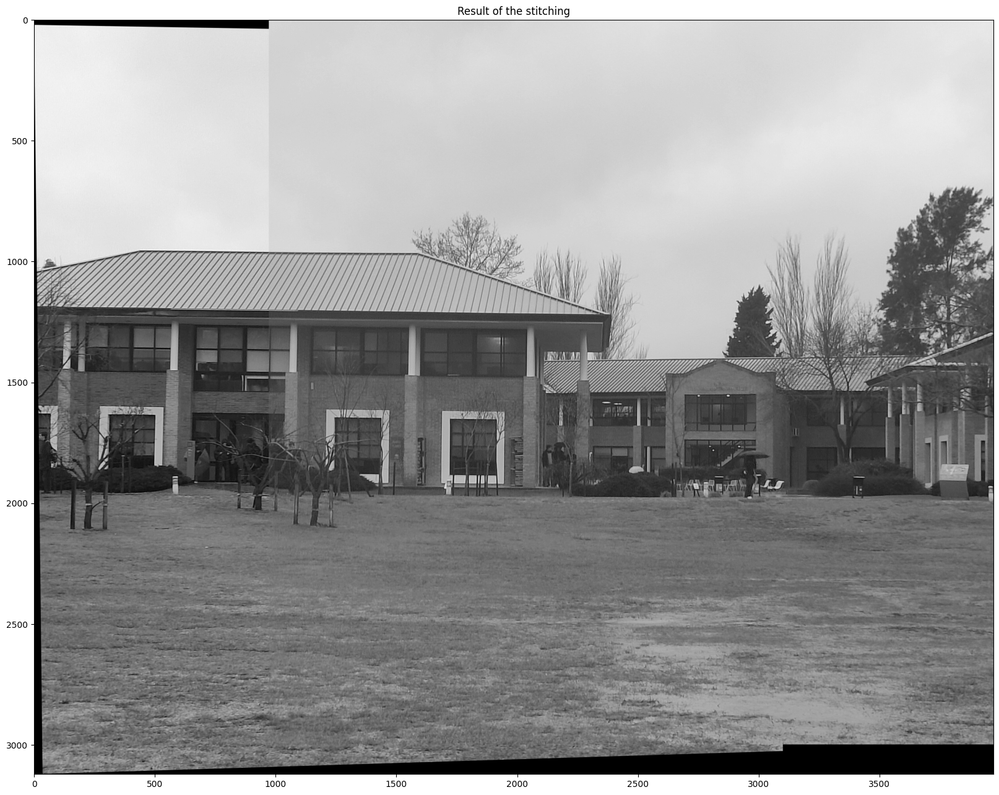

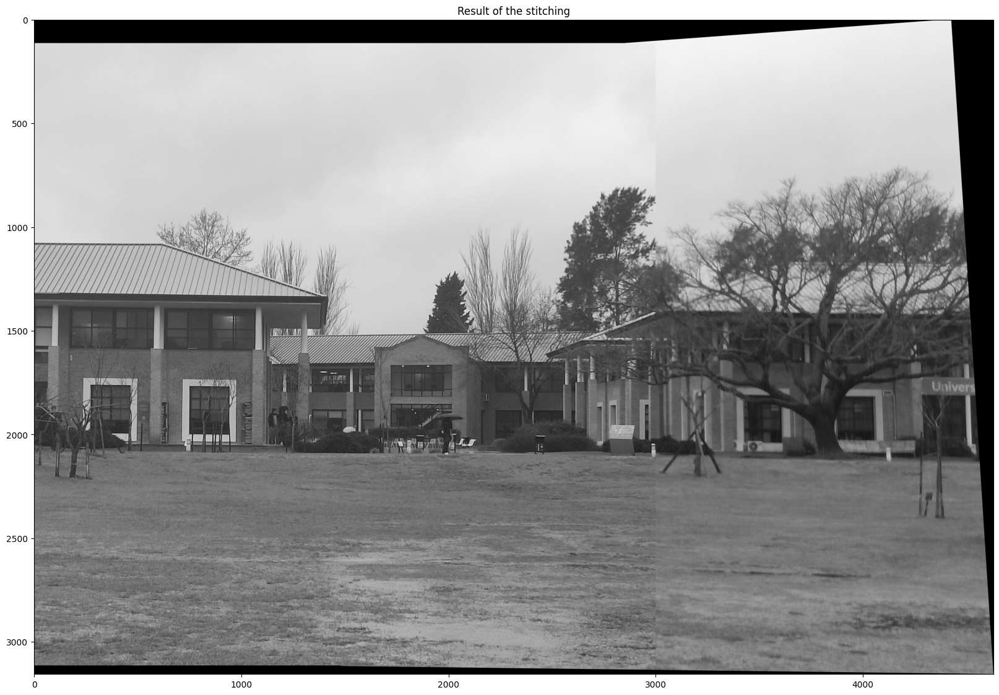

In [175]:
# Display result 
plt.figure(figsize=(20, 16))
plt.imshow(result01, cmap='gray')
plt.title("Result of the stitching")
plt.show()

plt.figure(figsize=(20, 16))
plt.imshow(result21, cmap='gray')
plt.title("Result of the stitching")
plt.show()

In [176]:
kp01, des01 = algo.detectAndCompute(result01, None)
kp21, des21 = algo.detectAndCompute(result21, None)

matches, matchesMask = match_descriptors(des01, des21)

good_matches = get_good_matches(matches, matchesMask)
print('Number of good matches:', len(good_matches)) 

H = find_homography(kp01, kp21, good_matches)
result = warp_images(result01, result21, H)

Number of good matches: 14258


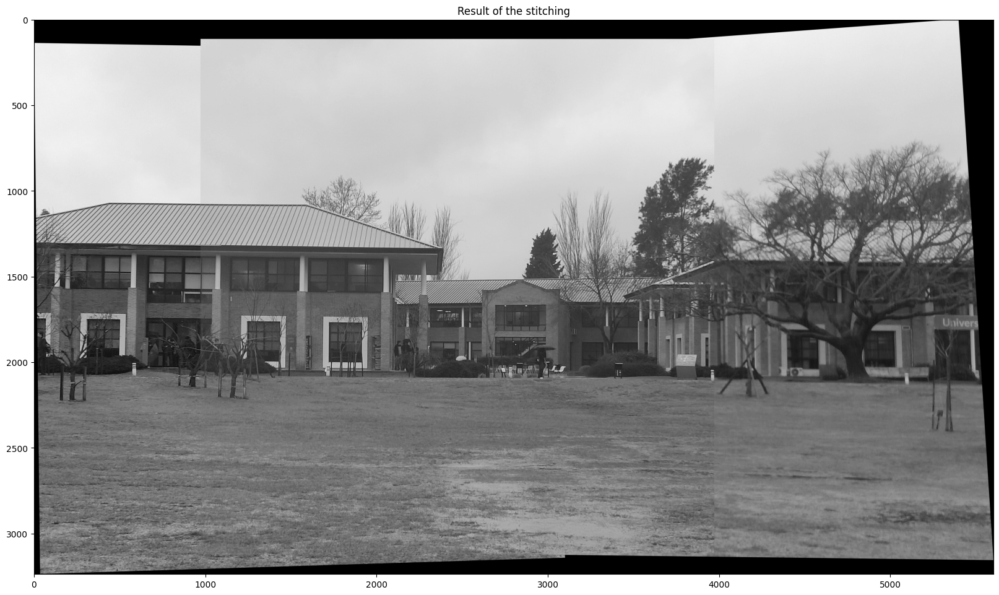

In [177]:
plt.figure(figsize=(20, 16))
plt.imshow(result, cmap='gray')
plt.title("Result of the stitching")
plt.show()

In [178]:
def stitch_images_full_color(img_left, img_anchor, img_right, H_left_to_anchor, H_right_to_anchor):
    # Convertir las imágenes de BGR a sus tres canales individuales
    left_channels = cv2.split(img_left)
    anchor_channels = cv2.split(img_anchor)
    right_channels = cv2.split(img_right)
    
    stitched_channels = []

    # Iterar a través de los canales de color (B, G, R)
    for i in range(3):
        # Obtener el canal i de cada imagen
        img_left_channel = left_channels[i]
        img_anchor_channel = anchor_channels[i]
        img_right_channel = right_channels[i]
        
        # Llamar a la función de blending para cada canal individual
        stitched_channel = stitch_images_full(
            img_left_channel, img_anchor_channel, img_right_channel, 
            H_left_to_anchor.astype(np.float32), H_right_to_anchor.astype(np.float32)
        )
        
        # Agregar el canal mezclado a la lista
        stitched_channels.append(stitched_channel)

    # Combinar los canales mezclados en una sola imagen BGR
    result = cv2.merge(stitched_channels)
    
    # Asegurar que cualquier píxel fuera del área transformada sea negro
    result[np.isnan(result)] = 0

    return result


def stitch_images_full(img_left, img_anchor, img_right, H_left_to_anchor, H_right_to_anchor):
    # Obtener dimensiones de las imágenes
    h_left, w_left = img_left.shape
    h_anchor, w_anchor = img_anchor.shape
    h_right, w_right = img_right.shape
    
    # Calcular las esquinas transformadas de las imágenes
    corners_left = np.float32([[0, 0], [0, h_left], [w_left, h_left], [w_left, 0]]).reshape(-1, 1, 2)
    corners_right = np.float32([[0, 0], [0, h_right], [w_right, h_right], [w_right, 0]]).reshape(-1, 1, 2)
    corners_anchor = np.float32([[0, 0], [0, h_anchor], [w_anchor, h_anchor], [w_anchor, 0]]).reshape(-1, 1, 2)

    transformed_corners_left = cv2.perspectiveTransform(corners_left, H_left_to_anchor)
    transformed_corners_right = cv2.perspectiveTransform(corners_right, H_right_to_anchor)

    # Unir todas las esquinas para obtener el tamaño de la imagen de salida
    all_corners = np.concatenate((transformed_corners_left, transformed_corners_right, corners_anchor), axis=0)

    [x_min, y_min] = np.int32(all_corners.min(axis=0).ravel() - 0.5)
    [x_max, y_max] = np.int32(all_corners.max(axis=0).ravel() + 0.5)

    # Calcular la traslación para que todas las imágenes estén dentro del marco
    H_translation = np.array([[1, 0, -x_min],
                              [0, 1, -y_min],
                              [0, 0, 1]], dtype=np.float32)

    # Aplicar la transformación a cada imagen con un borde negro
    result_left = cv2.warpPerspective(img_left, H_translation.dot(H_left_to_anchor), (x_max - x_min, y_max - y_min), borderValue=(0, 0, 0))
    result_anchor = cv2.warpPerspective(img_anchor, H_translation, (x_max - x_min, y_max - y_min), borderValue=(0, 0, 0))
    result_right = cv2.warpPerspective(img_right, H_translation.dot(H_right_to_anchor), (x_max - x_min, y_max - y_min), borderValue=(0, 0, 0))

    # Crear máscaras de blending basadas en la distancia
    mask_left = (result_left > 0).astype(np.float32)
    mask_anchor = (result_anchor > 0).astype(np.float32)
    mask_right = (result_right > 0).astype(np.float32)

    # Crear una máscara de peso que favorezca las áreas centrales
    mask_left_blur = cv2.distanceTransform((mask_left * 255).astype(np.uint8), cv2.DIST_L2, 5)
    mask_anchor_blur = cv2.distanceTransform((mask_anchor * 255).astype(np.uint8), cv2.DIST_L2, 5)
    mask_right_blur = cv2.distanceTransform((mask_right * 255).astype(np.uint8), cv2.DIST_L2, 5)

    # Aplicar suavizado gaussiano adicional a las máscaras de blending
    mask_left_blur = cv2.GaussianBlur(mask_left_blur, (15, 15), 0)
    mask_anchor_blur = cv2.GaussianBlur(mask_anchor_blur, (15, 15), 0)
    mask_right_blur = cv2.GaussianBlur(mask_right_blur, (15, 15), 0)

    # Normalizar las máscaras
    total_mask = mask_left_blur + mask_anchor_blur + mask_right_blur + 1e-10
    mask_left_blur /= total_mask
    mask_anchor_blur /= total_mask
    mask_right_blur /= total_mask

    # Calcular la suma ponderada de las imágenes utilizando la máscara
    result = (result_left * mask_left_blur + result_anchor * mask_anchor_blur + result_right * mask_right_blur)

    # Ajustar el resultado final a valores válidos de píxeles y asegurar que el fondo sea negro
    result = np.clip(result, 0, 255).astype(np.uint8)

    # Establecer cualquier píxel fuera de la región transformada a negro
    result[np.isnan(result)] = 0

    return result

In [179]:
# Leemos las imagenes en BGR 
cuadro0_color = cv2.imread('img/udesa_0.jpg', cv2.IMREAD_COLOR) # --> source image 
cuadro1_color = cv2.imread('img/udesa_1.jpg', cv2.IMREAD_COLOR)  # --> destination image 1
cuadro2_color = cv2.imread('img/udesa_2.jpg', cv2.IMREAD_COLOR) # --> destination image 2

result = stitch_images_full_color(cuadro0_color, cuadro1_color, cuadro2_color, H01, H21)

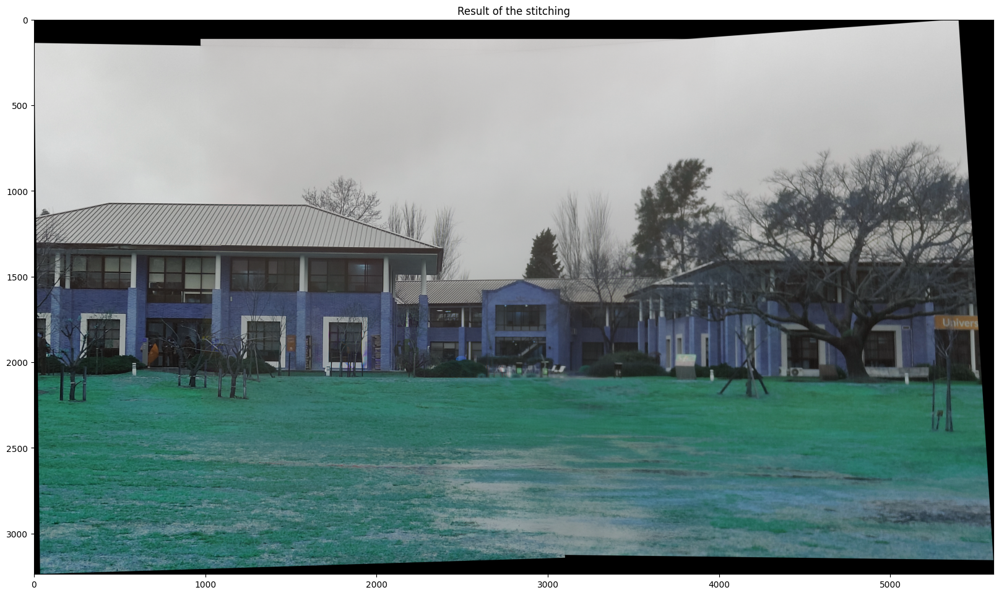

In [181]:
plt.figure(figsize=(20, 16))
plt.imshow(result)
plt.title("Result of the stitching")
plt.show()